In [ ]:
# file paths

TRAIN_IMG_PATH = "drive/MyDrive/bttai - MSKCC/MoNuSegDataset_TechAIChallenge/MoNuSegTrainData/Tissue Images/"
TEST_IMG_PATH = "drive/MyDrive/bttai - MSKCC/MoNuSegDataset_TechAIChallenge/MoNuSegTestData/Tissue Images/"

TRAIN_MASK_PATH = "drive/MyDrive/bttai - MSKCC/MoNuSegDataset_TechAIChallenge/MoNuSegTrainData/Masks/"
TEST_MASK_PATH = "drive/MyDrive/bttai - MSKCC/MoNuSegDataset_TechAIChallenge/MoNuSegTestData/Masks/"

TRAIN_NORM_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/train/normalized/"
TEST_NORM_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/test/normalized/"

TRAIN_TILED_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/train/tiled/"
TEST_TILED_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/test/tiled/"

TRAIN_AUG_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/train/augmented/"

TRAIN_MASK_TIL_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/train/masks_tiled/"
TRAIN_MASK_FINAL_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/train/masks_tiled_augmented/"
TEST_MASK_FINAL_PATH = "drive/MyDrive/bttai - MSKCC/preprocessed_images/test/masks_tiled/"

#Setup and Import

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install staintools
!pip install spams
!pip install tiler
!pip install imgaug

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import staintools as staintools

from tiler import Tiler, Merger
import matplotlib.image as mpimg
import cv2
import math

import imgaug
from imgaug import augmenters as iaa

import os
from os import listdir
from os.path import isfile, join

from PIL import Image

import datetime

#Preprocessing Object

In [ ]:
class PreProcessing:
  def __init__(self, path_to_training, path_to_testing):
    self.training_imgs_path = path_to_training
    self.testing_imgs_path = path_to_testing

    # names of images
    self.train_names = np.sort(np.array([file_name for file_name in listdir(self.training_imgs_path) if isfile(join(self.training_imgs_path, file_name))]))
    self.test_names = np.sort(np.array([file_name for file_name in listdir(self.testing_imgs_path) if isfile(join(self.testing_imgs_path, file_name))]))

    # normalize images
    self.training_imgs = []
    self.testing_imgs = []

    # normalized and tiled images
    self.training_imgs_tiled = []
    self.testing_imgs_tiled = []

    # normalized, tiled and augmented training images
    self.training_imgs_aug = []

#Normalization Function

In [ ]:
# normalization of all data
def normalize_dataset(model):
  model.training_imgs = []
  model.testing_imgs = []
  # getting names of image files
  # train_names = [file_name for file_name in listdir(model.training_imgs_path) if isfile(join(model.training_imgs_path, file_name))]
  # test_names = [file_name for file_name in listdir(model.testing_imgs_path) if isfile(join(model.testing_imgs_path, file_name))]

  # getting images
  train_transform = [staintools.read_image(model.training_imgs_path+"/"+img_name) for img_name in model.train_names]
  test_transform = [staintools.read_image(model.testing_imgs_path+"/"+img_name) for img_name in model.test_names]

  # Standardize brightness (optional, can improve the tissue mask calculation)
  train_transform = list(map(staintools.LuminosityStandardizer.standardize, train_transform))
  test_transform = list(map(staintools.LuminosityStandardizer.standardize, test_transform))

  # Stain normalize
  target = train_transform.pop(0)
  normalizer = staintools.StainNormalizer(method='vahadane')
  normalizer.fit(target)
  transformed_imgs_train = list(map(normalizer.transform, train_transform))
  transformed_imgs_test = list(map(normalizer.transform, test_transform))

  # set normalized image attribute to normalized training images
  model.training_imgs = [target] + transformed_imgs_train
  title1 =  ["target"] + ['train_normalized']*(len(transformed_imgs_train))
  # show train normalized
  staintools.plot_image_list(model.training_imgs,width=5,title_list=title1)

  # set normalized test image attribute to normalized test images
  model.testing_imgs = transformed_imgs_test
  title2 = ["target"] + ['test_normalized']*(len(test_transform))
  # show test normalized
  staintools.plot_image_list([target] + model.testing_imgs,width=5,title_list=title2)
    

#Tiling Function

In [ ]:
# to tile data set
def tile_dataset(model):
  model.training_imgs_tiled = []
  model.testing_imgs_tiled = []

  # Setup tiling parameters
  tile_shape = (256,256,3)
  data_shape = model.training_imgs[0].shape # should be (1000,1000,3)

  tiler = Tiler(data_shape=data_shape,
              tile_shape=tile_shape,
              overlap=0.0228135851)

  fig1 = plt.figure()
  rows = 15
  cols = math.ceil((math.ceil((data_shape[0]/tile_shape[0])) * math.ceil((data_shape[1]/tile_shape[1])) * len(model.training_imgs)) / rows)
  counter = 1    
  # append tiled training images to self.training_imgs_tiled
  for training_image in model.training_imgs:
    for tile_id, tile in tiler(training_image):
      model.training_imgs_tiled.append(tile)

      # to print tiles
      ax = fig1.add_subplot(rows, cols, counter)
      ax.axis("off")
      plt.imshow(tile)
      counter+=1

  fig2 = plt.figure()
  rows = 15
  cols = math.ceil((math.ceil((data_shape[0]/tile_shape[0])) * math.ceil((data_shape[1]/tile_shape[1])) * len(model.testing_imgs)) / rows)
  counter = 1 
  # append tiled test images to self.testing_imgs_tiled
  for test_image in model.testing_imgs:
    for tile_id, tile in tiler(test_image):
      model.testing_imgs_tiled.append(tile)

      # to print tiles
      ax = fig2.add_subplot(rows, cols, counter)
      ax.axis("off")
      plt.imshow(tile)
      counter+=1

#Preprocessing Data

In [ ]:
# making preprocessing objects

data = PreProcessing(TRAIN_IMG_PATH, TEST_IMG_PATH)

In [ ]:
# import mask images

masks_binary_seg = PreProcessing(TRAIN_MASK_PATH, TEST_MASK_PATH)

masks_cell_seg = PreProcessing(TRAIN_MASK_PATH, TEST_MASK_PATH)

for file in masks_binary_seg.train_names:
  img = cv2.imread(TRAIN_MASK_PATH + file)
  if "binary_seg" in file:
    masks_binary_seg.training_imgs.append(img)
  if "cell_seg" in file:
    masks_cell_seg.training_imgs.append(img)

for file in masks_binary_seg.test_names:
  img = cv2.imread(TEST_MASK_PATH + file)
  if "binary_seg" in file:
    masks_binary_seg.testing_imgs.append(img)
  if "cell_seg" in file:
    masks_cell_seg.testing_imgs.append(img)

In [ ]:
np.array(masks_binary_seg.training_imgs).shape

(37, 1000, 1000, 3)

#Normalization

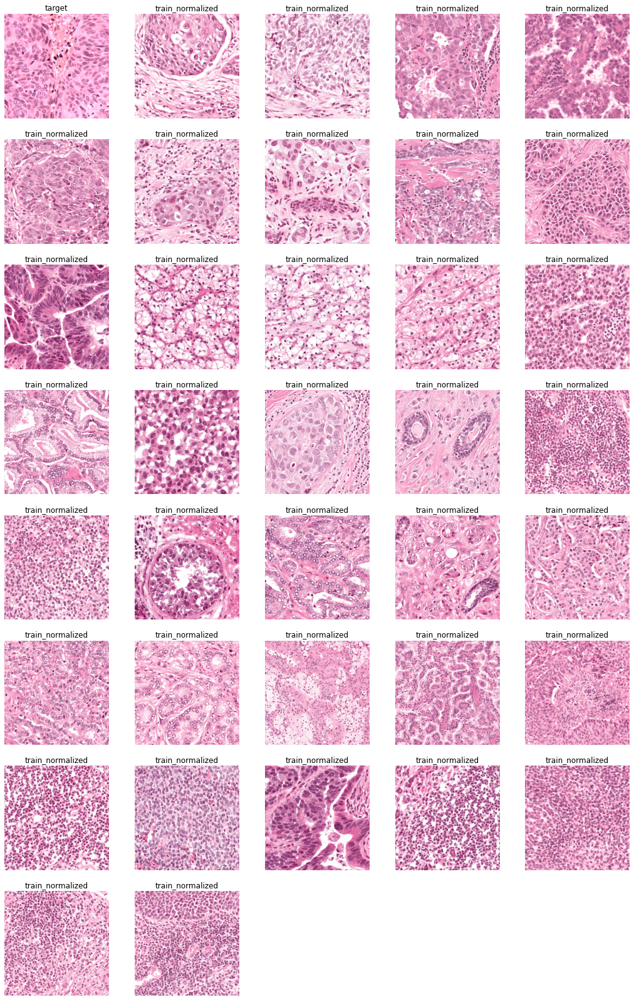

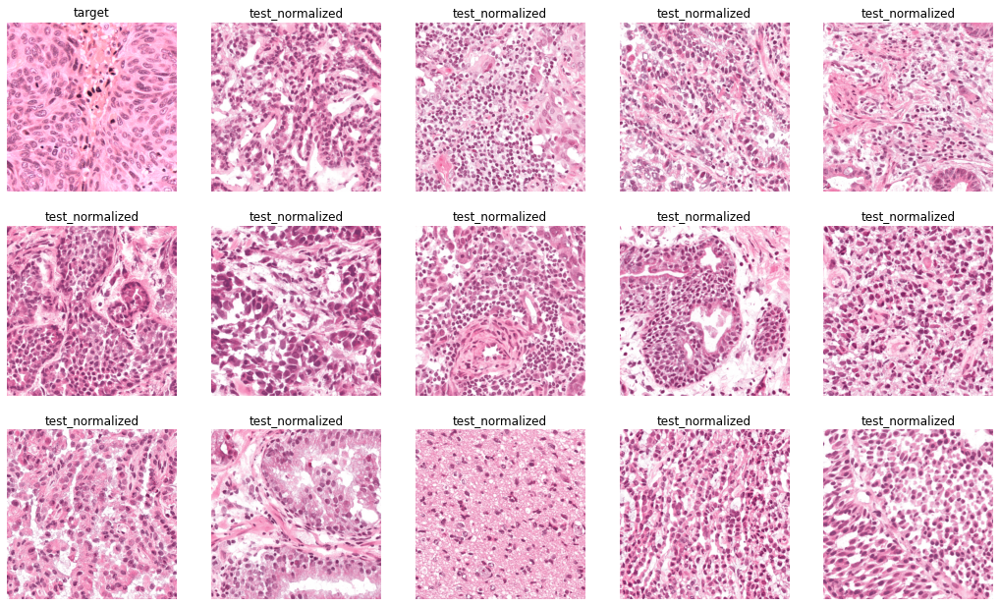

In [ ]:
# calling normalize
# takes up to 2 mins // be patient
normalize_dataset(data)

In [ ]:
len(data.training_imgs)

37

In [ ]:
# saving normalized images

for i in range(len(data.training_imgs)):
    im = Image.fromarray(data.training_imgs[i])
    img_name = data.train_names[i]
    im.save(TRAIN_NORM_PATH + img_name)

for j in range(len(data.testing_imgs)):
    im2 = Image.fromarray(data.testing_imgs[j])
    img_name2 = data.test_names[j]
    im2.save(TEST_NORM_PATH + img_name2)  

#Tiling

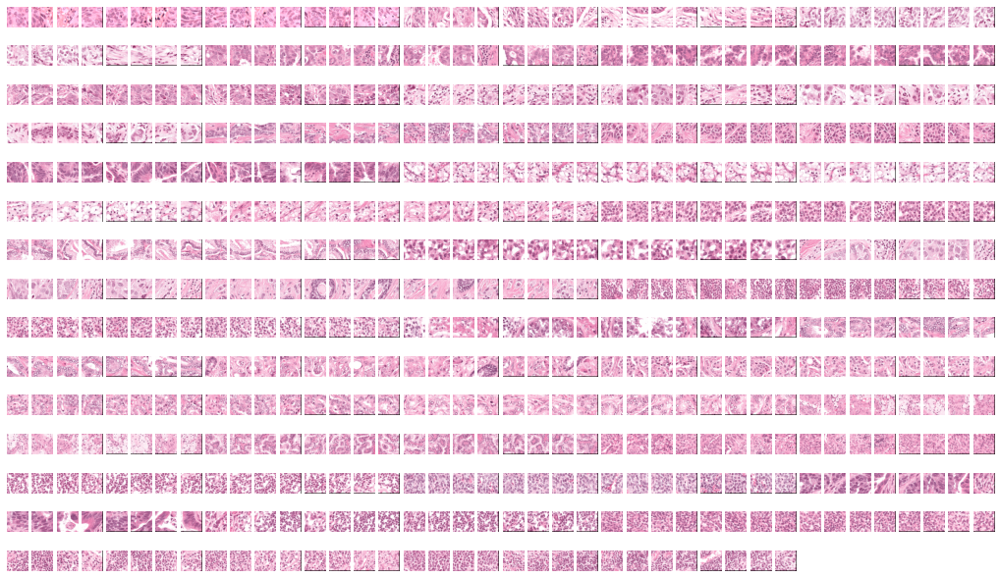

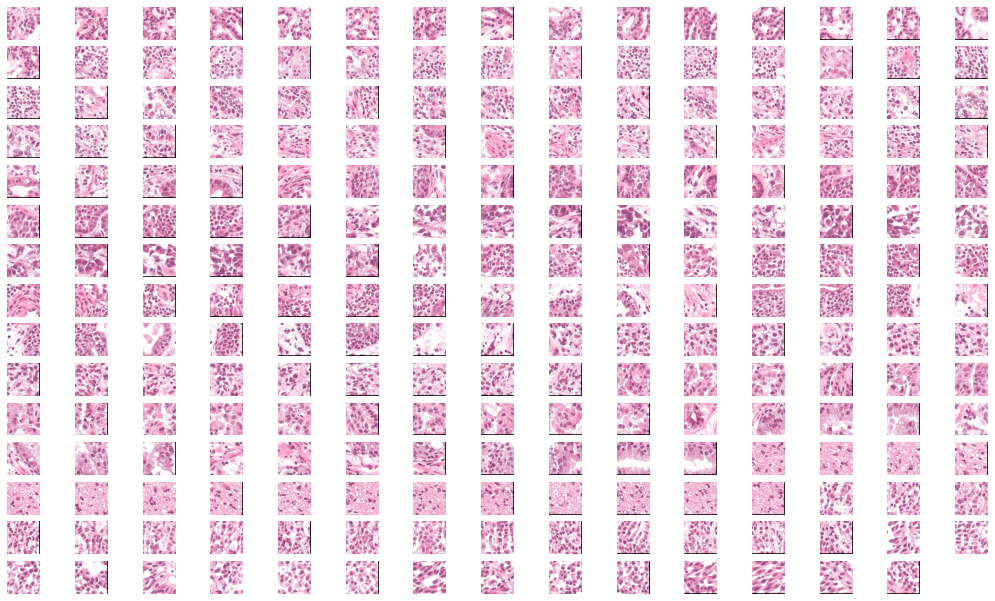

In [ ]:
# tiling tissue images
tile_dataset(data)

In [ ]:
len(data.training_imgs_tiled)

592

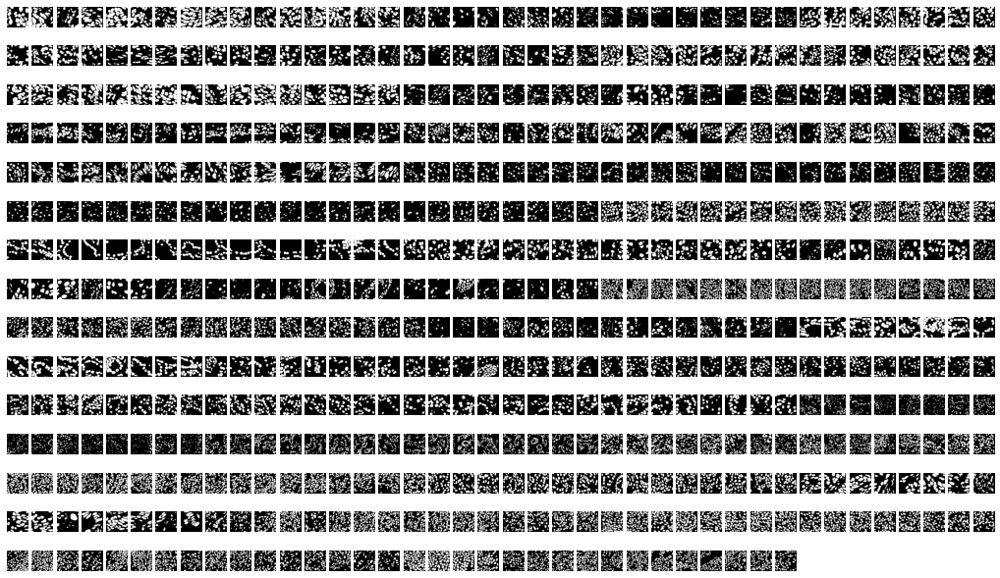

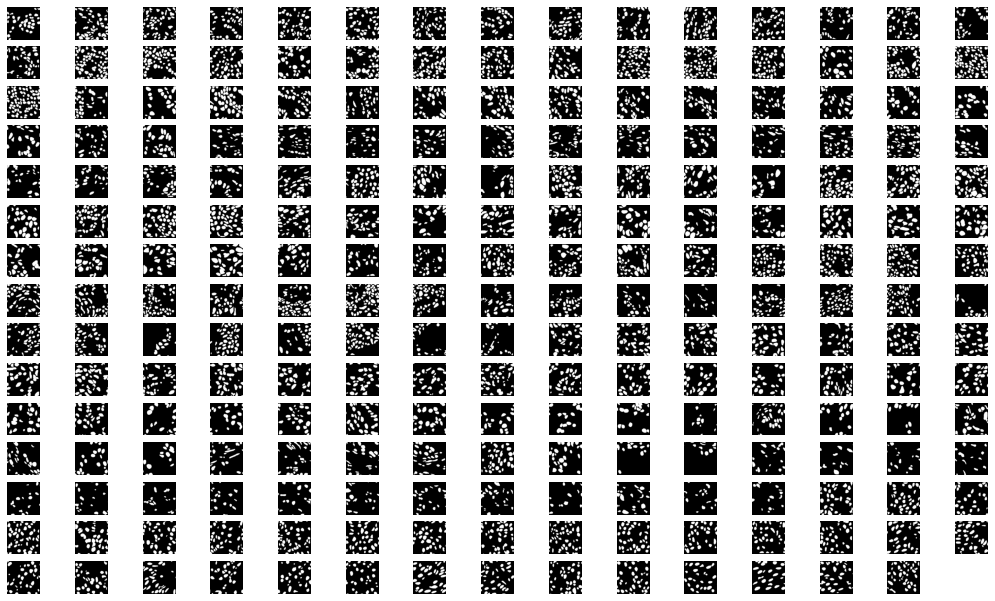

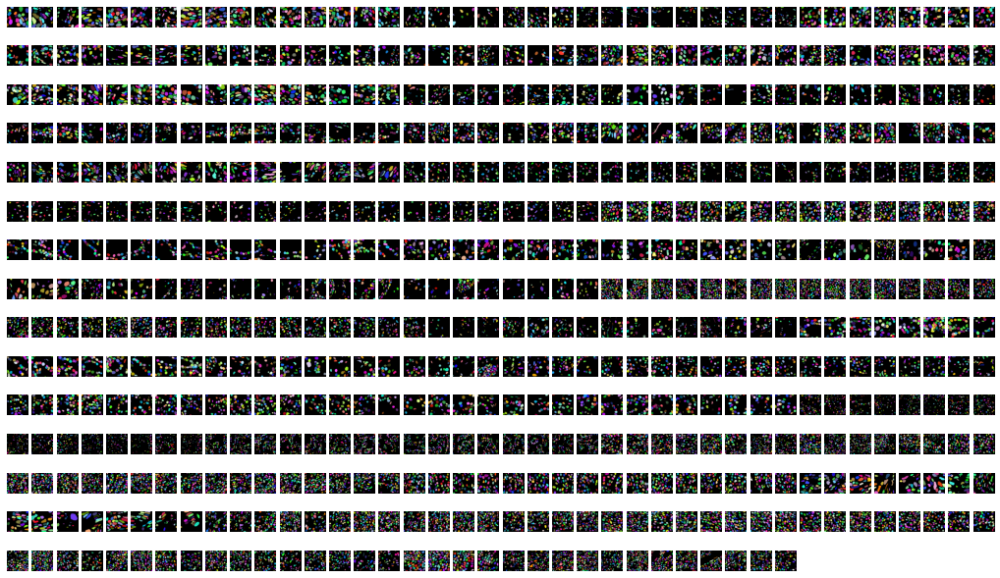

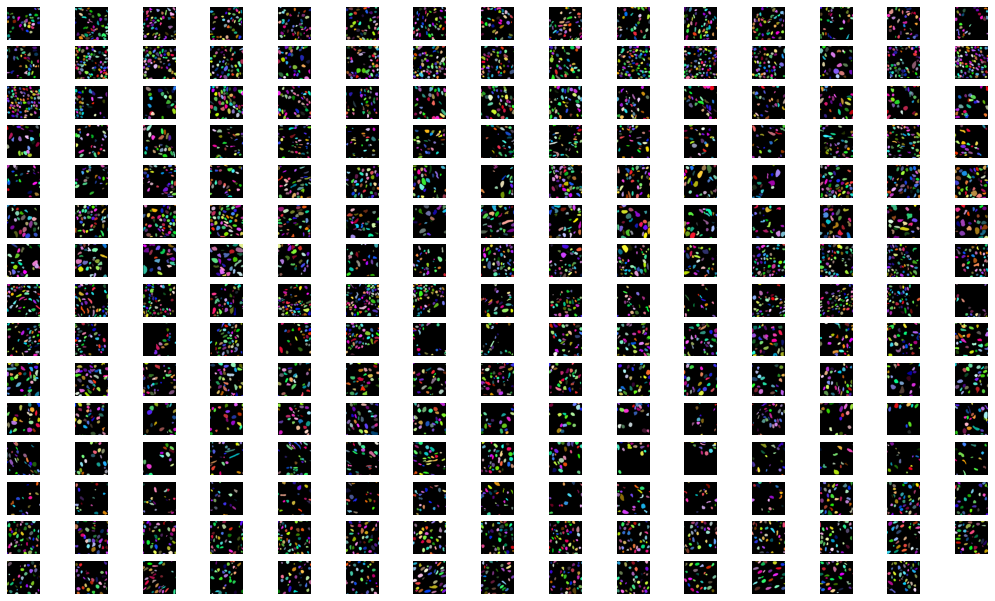

In [ ]:
# tiling masks
tile_dataset(masks_binary_seg)
tile_dataset(masks_cell_seg)

In [ ]:
len(masks_binary_seg.training_imgs_tiled)

592

In [ ]:
len(masks_cell_seg.training_imgs_tiled)

592

TCGA-18-5592-01Z-00-DX1.tif
TCGA-18-5592-01Z-00-DX1_binary_seg.png
TCGA-18-5592-01Z-00-DX1_binary_seg.png


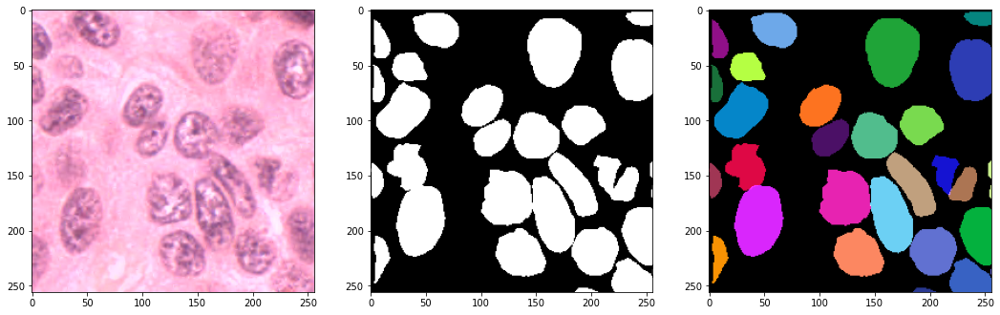

In [ ]:
print(data.train_names[0])
print(masks_binary_seg.train_names[0])
print(masks_cell_seg.train_names[0])

fig = plt.figure()
row = 1
col = 2

plt.subplot(1, 3, 1)
plt.imshow(data.training_imgs_tiled[0])

plt.subplot(1, 3, 2)
plt.imshow(masks_binary_seg.training_imgs_tiled[0])

plt.subplot(1, 3, 3)
plt.imshow(masks_cell_seg.training_imgs_tiled[0])

In [ ]:
data.train_names[i][:-4]

'TCGA-XS-A8TJ-01Z-00-DX1'

In [ ]:
# saving data

# tissue train
for i in range(len(data.training_imgs_tiled)):
    im = Image.fromarray(data.training_imgs_tiled[i])
    img_name = data.train_names[i//16][:-4] + "_tile" + str(i%16) + ".jpg"
    im.save(TRAIN_TILED_PATH + img_name)

# tissue test
for i in range(len(data.testing_imgs_tiled)):
    im = Image.fromarray(data.testing_imgs_tiled[i])
    img_name = data.test_names[i//16][:-4] + "_tile" + str(i%16) + ".jpg"
    im.save(TEST_TILED_PATH + img_name)

# mask binary train
for i in range(len(masks_binary_seg.training_imgs_tiled)):
    im = Image.fromarray(masks_binary_seg.training_imgs_tiled[i])
    img_name = masks_binary_seg.train_names[i//16][:-4] + "_tile" + str(i%16) + ".jpg" 
    im.save(TRAIN_MASK_TIL_PATH + img_name)

# mask binary test
for i in range(len(masks_binary_seg.testing_imgs_tiled)):
    im = Image.fromarray(masks_binary_seg.testing_imgs_tiled[i])
    img_name = masks_binary_seg.test_names[i//16][:-4] + "_tile" + str(i%16) + ".jpg"
    im.save(TEST_MASK_FINAL_PATH + img_name)


In [ ]:
np.array(masks_binary_seg.training_imgs_tiled).shape

(592, 256, 256, 3)

In [ ]:
np.array(masks_cell_seg.training_imgs_tiled).shape

(592, 256, 256, 3)

In [ ]:
np.array(data.training_imgs_tiled).shape

(592, 256, 256, 3)

In [ ]:
print(len(data.training_imgs_tiled))

592


#Implement U-Net

In [ ]:
# citation: U-net for image segmentation youtube playlist
# link: https://www.youtube.com/playlist?list=PLZsOBAyNTZwbR08R959iCvYT3qzhxvGOE 
from keras.utils import normalize
import os
import cv2
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
image_directory = "drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/"
mask_directory = "drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/"

SIZE = 256
# We'll eventually convert these to numpy arrays
image_dataset = []  
mask_dataset = []  

In [ ]:
images = os.listdir(image_directory)

import re

def natural_sort_key(s, _nsre=re.compile('([0-9]+)')):
    return [
        int(text)
        if text.isdigit() else text.lower()
        for text in _nsre.split(s)]

sorted_images = sorted(images, key=natural_sort_key)
#sorted_images

In [ ]:
for i, image_name in enumerate(sorted_images):    #Remember enumerate method adds a counter and returns the enumerate object
    if (image_name.split('.')[1] == 'jpg'):
        print(image_directory+image_name)
        # For each element in the list, read it with cv2.imread
        image = cv2.imread(image_directory+image_name)
        #plt.imshow(image)
        #plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        #plt.show()     
        image = Image.fromarray(image) # convert into pillow object
        image = image.resize((SIZE, SIZE))  # resize it
        # convert back into array and append to image data set
        image_dataset.append(np.array(image))

drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile0.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile1.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile2.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile3.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile4.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile5.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile6.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile7.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA-18-5592-01Z-00-DX1_tile8.jpg
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/tiled/TCGA

In [ ]:
np.array(image_dataset).shape

(592, 256, 256, 3)

In [ ]:
masks = os.listdir(mask_directory)
sorted_masks = sorted(masks, key=natural_sort_key)
sorted_masks

['TCGA-18-5592-01Z-00-DX1_binary_seg0.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg1.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg2.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg3.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg4.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg5.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg6.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg7.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg8.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg9.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg10.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg11.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg12.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg13.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg14.png',
 'TCGA-18-5592-01Z-00-DX1_binary_seg15.png',
 'TCGA-21-5784-01Z-00-DX1_binary_seg0.png',
 'TCGA-21-5784-01Z-00-DX1_binary_seg1.png',
 'TCGA-21-5784-01Z-00-DX1_binary_seg2.png',
 'TCGA-21-5784-01Z-00-DX1_binary_seg3.png',
 'TCGA-21-5784-01Z-00-DX1_binary_seg4.png',
 'TCGA-21-5784-01Z-00-DX1_binary_seg5.png',
 'TCGA-21-5784-01Z-00-DX1_

In [ ]:
for i, image_name in enumerate(sorted_masks):
    if (image_name.split('.')[1] == 'png'):
        print(mask_directory+image_name)
        image = cv2.imread(mask_directory+image_name, 0)
        #plt.imshow(image)
        #plt.show() 
        image = Image.fromarray(image)
        image = image.resize((SIZE, SIZE))
        mask_dataset.append(np.array(image))

drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg0.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg1.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg2.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg3.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg4.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg5.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg6.png
drive/MyDrive/bttai-MSKCC-nicoleCopy/preprocessed_images/train/train_tiled_binary/TCGA-18-5592-01Z-00-DX1_binary_seg7.png
drive/MyDrive/bttai-MSKC

In [ ]:
#Convert into np.array and normalize images
# Normalization: 8-bit --> float64
#image_dataset = np.expand_dims(normalize(np.array(image_dataset), axis=1),3)  # expand dimensions by 1 to ensure the images are ready for U-Net model
image_dataset = normalize(np.array(image_dataset), axis=1)

In [ ]:
np.array(image_dataset).shape

(592, 256, 256, 3)

In [ ]:
np.array(mask_dataset).shape

(592, 256, 256)

In [ ]:
mask_dataset = np.expand_dims((np.array(mask_dataset)),3) /255.

In [ ]:
np.array(mask_dataset).shape

(592, 256, 256, 1)

In [ ]:
np.unique(mask_dataset)

array([0., 1.])

In [ ]:
import tensorflow as tf 
from tensorflow import keras
from keras.layers import Input, Conv2D, MaxPooling2D, Activation, ReLU
from keras.layers import BatchNormalization, Conv2DTranspose, Concatenate
from keras.models import Model, Sequential

In [ ]:
IMG_HEIGHT = image_dataset.shape[1]
IMG_WIDTH  = image_dataset.shape[2]
IMG_CHANNELS = image_dataset.shape[3]

In [ ]:
from keras.layers import concatenate, Dropout
from keras.optimizers import Adam

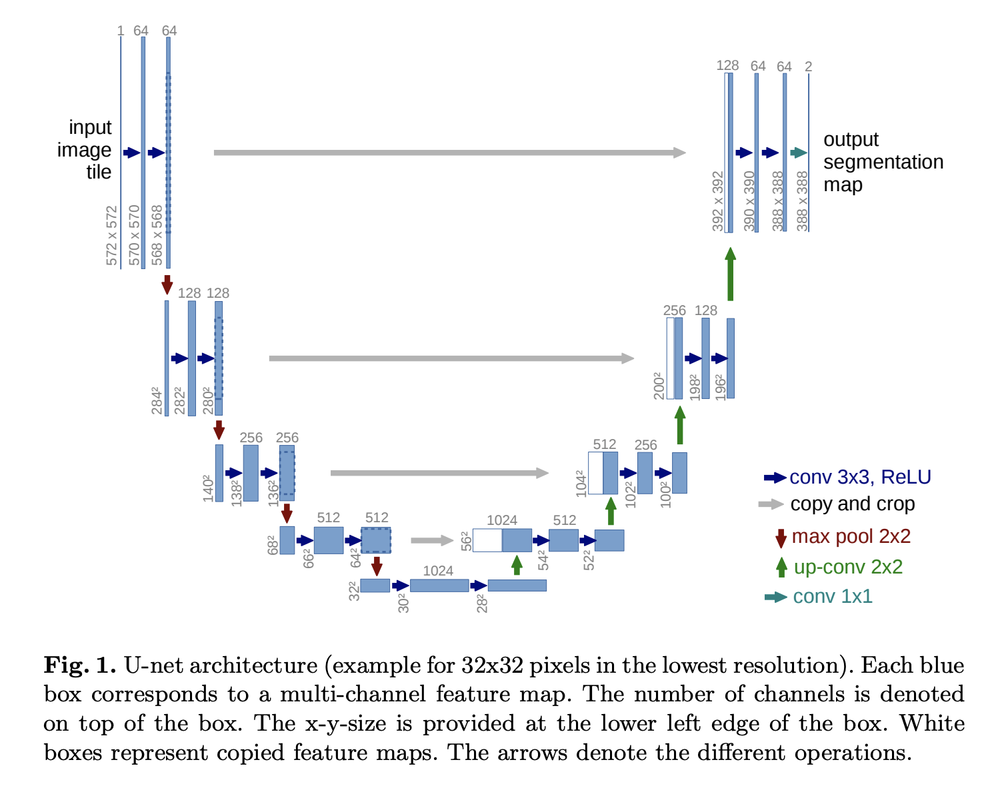

In [ ]:
def simple_unet_model_with_jacard(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction/Encoder path (going down the U) - this is made up of convolutional layers (c1, c2, etc)
    # feature space = 16; apply 3x3 convolutions; padding = same to keep output width and height same as input
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    
    #Expansive path (going up the U) - again, a bunch of convolutional layers
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    # sigmoid activation function ensures that the mask pixels are in a [0, 1] range 
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(lr = 1e-3), loss='binary_crossentropy', metrics=['accuracy'])
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    #model.compile(optimizer = 'adam', loss = [jaccard_coef_loss], metrics = [jaccard_coef])

    model.summary()
    
    return model
 

In [ ]:
model = simple_unet_model_with_jacard(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)

# Data Augmentation (on the fly)

In [ ]:
# citation: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
img_data_gen_args = dict(rotation_range=90,
                     width_shift_range=0.3,
                     height_shift_range=0.3,
                     zoom_range=0.3,
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect')
          

In [ ]:
mask_data_gen_args = dict(rotation_range=90,
                     width_shift_range=0.3,
                     height_shift_range=0.3,
                     zoom_range=0.3,
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect',
                     preprocessing_function = lambda x: np.where(x>0, 1, 0).astype(x.dtype)) #Binarize the output again. 

In [ ]:
# NOTE: we can also pass in validation_split as a parameter to model.fit instead of using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(image_dataset, mask_dataset, test_size = 0.10, random_state = 0)

In [ ]:
image_data_generator = ImageDataGenerator(**img_data_gen_args)

In [ ]:
# experiment with these numbers
batch_size= 8
seed = 24 
# epochs = 

In [ ]:
image_generator = image_data_generator.flow(X_train, seed=seed, batch_size=batch_size)
valid_img_generator = image_data_generator.flow(X_val, seed=seed, batch_size=batch_size) #Default batch size 32, if not specified here

In [ ]:
mask_data_generator = ImageDataGenerator(**mask_data_gen_args)

In [ ]:
mask_generator = mask_data_generator.flow(y_train, seed=seed, batch_size=batch_size)
valid_mask_generator = mask_data_generator.flow(y_val, seed=seed, batch_size=batch_size)  #Default batch size 32, if not specified here

In [ ]:
def my_image_mask_generator(image_generator, mask_generator):
    train_generator = zip(image_generator, mask_generator)
    for (img, mask) in train_generator:
        yield (img, mask)

In [ ]:
my_generator = my_image_mask_generator(image_generator, mask_generator)

In [ ]:
validation_datagen = my_image_mask_generator(valid_img_generator, valid_mask_generator)

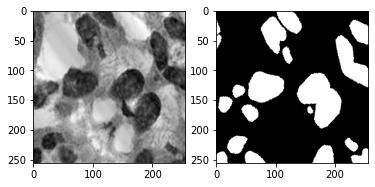

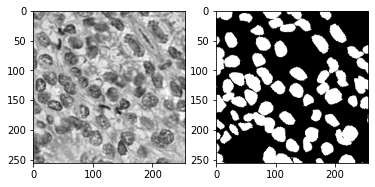

In [ ]:
x = image_generator.next()
y = mask_generator.next()
for i in range(0,2):
    image = x[i]
    mask = y[i]
    plt.subplot(1,2,1)
    plt.imshow(image[:,:,0], cmap = 'gray')
    plt.subplot(1,2,2)
    plt.imshow(mask[:,:,0], cmap = 'gray')
    plt.show()

In [ ]:
np.array(image_dataset).shape

(592, 256, 256, 3)

In [ ]:
np.array(mask_dataset).shape

(592, 256, 256, 1)

In [ ]:
steps_per_epoch = 3*(len(X_train))//batch_size

# Train the U-Net Model

In [ ]:
history = model.fit_generator(my_generator, validation_data=validation_datagen, 
                    steps_per_epoch=steps_per_epoch, 
                    validation_steps=steps_per_epoch, epochs=25)

Epoch 1/25


<ipython-input-65-13d822f22d5e>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(my_generator, validation_data=validation_datagen,


199/199 [==============================] - 61s 305ms/step - loss: 0.4712 - accuracy: 0.7576 - val_loss: 0.4862 - val_accuracy: 0.7469
Epoch 2/25
199/199 [==============================] - 61s 306ms/step - loss: 0.4766 - accuracy: 0.7553 - val_loss: 0.4766 - val_accuracy: 0.7531
Epoch 3/25
199/199 [==============================] - 64s 322ms/step - loss: 0.4734 - accuracy: 0.7547 - val_loss: 0.4822 - val_accuracy: 0.7526
Epoch 4/25
199/199 [==============================] - 61s 306ms/step - loss: 0.4738 - accuracy: 0.7577 - val_loss: 0.4792 - val_accuracy: 0.7537
Epoch 5/25
199/199 [==============================] - 60s 305ms/step - loss: 0.4782 - accuracy: 0.7527 - val_loss: 0.4800 - val_accuracy: 0.7549
Epoch 6/25
199/199 [==============================] - 61s 307ms/step - loss: 0.4730 - accuracy: 0.7574 - val_loss: 0.4815 - val_accuracy: 0.7486
Epoch 7/25
199/199 [==============================] - 64s 323ms/step - loss: 0.4737 - accuracy: 0.7552 - val_loss: 0.4778 - val_accuracy: 0.7

# Loss plots

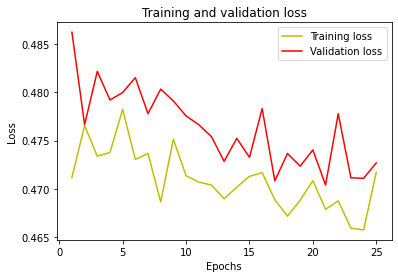

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Dice Coefficient

In [ ]:
# Dice Coefficient

# citation: https://karan-jakhar.medium.com/100-days-of-code-day-7-84e4918cb72c
from keras import backend as K
def dice_coef(y_true, y_pred, smooth=1):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  return(2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def IoU(y_true, y_pred):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
  return intersection/union


In [ ]:
# Jaccard Index 

# A measure of how many pixels corresponding to nuclei are truly identified as nuclei 
# citation: https://www.youtube.com/watch?v=BNPW1mYbgS4

#from keras import backend as K
#def jaccard_coef(y_true, y_pred):
    #y_true_f = K.flatten(y_true)
    #y_pred_f = K.flatten(y_pred)
    #intersection = K.sum(y_true_f * y_pred_f)
    #return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


#def jaccard_coef_loss(y_true, y_pred):
    #return -jaccard_coef(y_true, y_pred) 
# if y_pred and y_true are very close, the jaccard value is high 
# -1 multiplied as we want to minimize this value as loss function


# Evaluate on Test Data